In [4]:
import os 
import glob
import matplotlib.pyplot as plt

In [5]:
folder = r"C:\Users\nisha\Desktop\Coding\Thesis\Yolo\datasets\cell\jagadeesh_new_data"


infected =  [file for file in glob.glob(f'{folder}/*/infected/**', recursive = True) if file.endswith('.tif')]
control = [file for file in glob.glob(f'{folder}/*/control/**', recursive = True) if file.endswith('.tif')]




In [6]:
print('The number of Control images: ', len(control))
print('The number of Infected images: ', len(infected))

The number of Control images:  16
The number of Infected images:  31


In [7]:
import random

rand_control = random.sample(range(15),4)
rand_infected = random.sample(range(30), 4)

print(rand_control)
print(rand_infected)

[0, 1, 14, 7]
[28, 7, 9, 1]


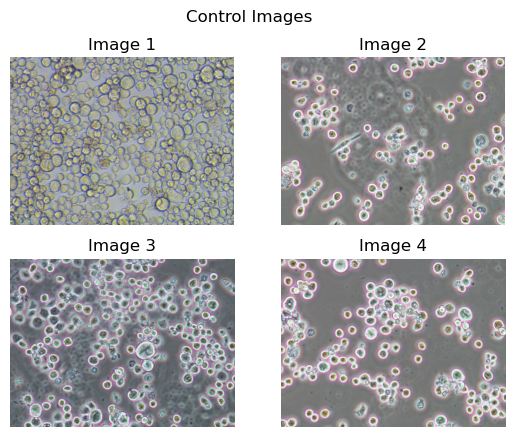

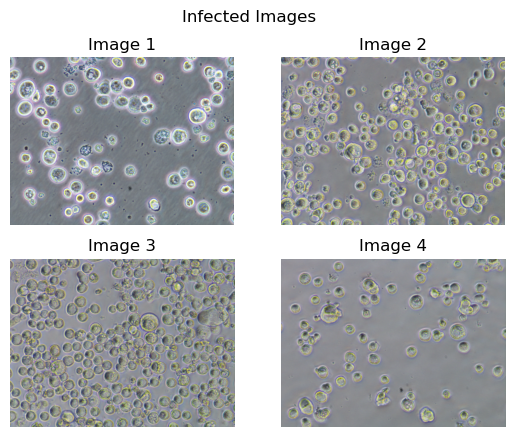

In [8]:
save_folder = r'C:\Users\nisha\Desktop\Coding\Thesis\Yolo\HOG and SVM\cell auto labelling\Sorted Code\Figures\Visualize'


fig, ax = plt.subplots(nrows = 2, ncols = 2)
ax = ax.flatten()
for i in range(len(rand_control)):
    img = plt.imread(control[rand_control[i]])
    ax[i].imshow(img)
    ax[i].axis('off')
    ax[i].set_title(f'Image {i + 1}')
fig.suptitle('Control Images')
    
plt.show()
fig.savefig(f'{save_folder}\\control_images.png')


fig, ax = plt.subplots(nrows = 2, ncols = 2)
ax = ax.flatten()
for i in range(len(rand_infected)):
    img = plt.imread(infected[rand_infected[i]])
    ax[i].imshow(img)
    ax[i].axis('off')
    ax[i].set_title(f'Image {i + 1}')
fig.suptitle('Infected Images')
    
plt.show()
fig.savefig(f'{save_folder}\\infected_images.png')

In [9]:
from matplotlib.pyplot import imread, imsave

In [10]:
sample_control = imread(control[rand_control[2]])
sample_infected = imread(infected[rand_infected[3]])

imsave(f'{save_folder}\\sample_control.jpg', sample_control )
imsave(f'{save_folder}\\sample_infected.jpg', sample_infected )

In [11]:
import json
with open(f'{save_folder}\\sample_infected.json', 'r') as f:
    data_infected = json.load(f)

with open(f'{save_folder}\\sample_control.json', 'r') as f:
    data_control = json.load(f)
    
dia_infected = []
dia_control = []
for i, v in enumerate(data_infected):
    width = v['rectMask']['width']
    height = v['rectMask']['height']
    dia = min(width, height)
    dia_infected.append(dia)
    
for i, v in enumerate(data_control):
    width = v['rectMask']['width']
    height = v['rectMask']['height']
    dia = min(width, height)
    dia_control.append(dia)
import numpy as np

print(np.mean(dia_infected))
print(np.mean(dia_control))
    

    


173.22091062394605
110.08431703204047


In [12]:
malaria_folder = r'C:\Users\nisha\Desktop\Coding\Thesis\Yolo\datasets\cell\malaria\malaria\images'

malaria_images = glob.glob(f'{malaria_folder}/**.png', recursive = True)



img = random.sample(malaria_images, 4)



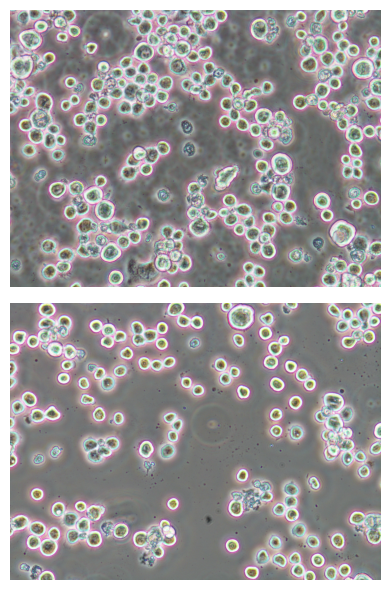

In [13]:
fig, ax = plt.subplots(nrows =2, ncols = 1, figsize = (4,6))
ax = ax.flatten()

for i in range(2):
    ax[i].imshow(imread(control[i+4])[:,:,:])
    ax[i].axis('off')
plt.tight_layout()
plt.show()

fig.savefig(f'{save_folder}\\compare_cells_1.png')

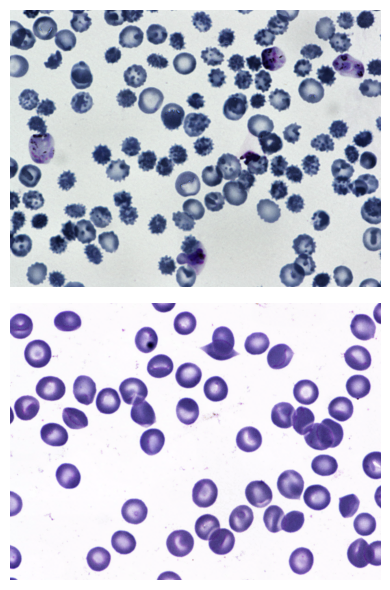

In [14]:
fig, ax = plt.subplots(nrows =2, ncols = 1, figsize = (4,6))
ax = ax.flatten()

for i in range(2):
    ax[i].imshow(imread(img[i])[:,:,:])
    ax[i].axis('off')
plt.tight_layout()
plt.show()

fig.savefig(f'{save_folder}\\similar_cells_1.png')

In [15]:
print(len(malaria_images))



with open(f'{save_folder}\\malaria_labelled.json','r') as f:
    malaria_labelled = json.load(f)

malaria_size = []
for i,v in enumerate(malaria_labelled):
    width = v['rectMask']['width']
    height = v['rectMask']['width']
    malaria_size.append(min(width, height))
print(np.mean(malaria_size))

1210
98.14502529510962


In [16]:
from skimage.feature import hog


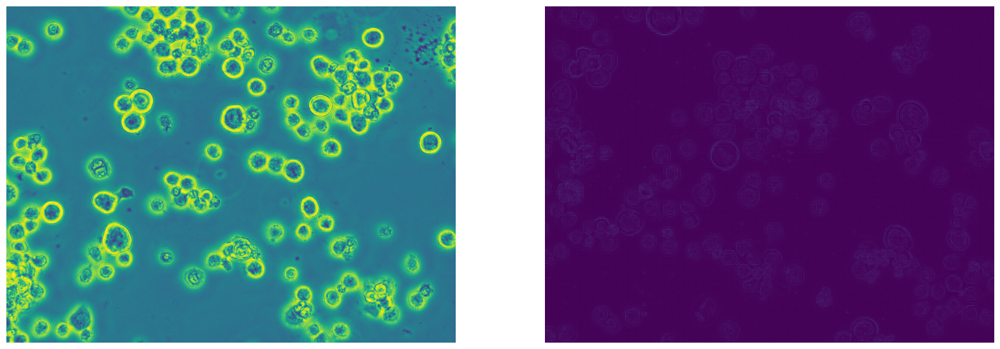

In [17]:
f, img = hog(imread(control[7])[:,:,0], visualize = True)

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 15))
ax = ax.flatten()
ax[0].imshow(imread(control[6])[:,:,0])
ax[0].axis('off')
ax[1].imshow(img)
ax[1].axis('off')

plt.show()

(-0.5, 2559.5, 1919.5, -0.5)

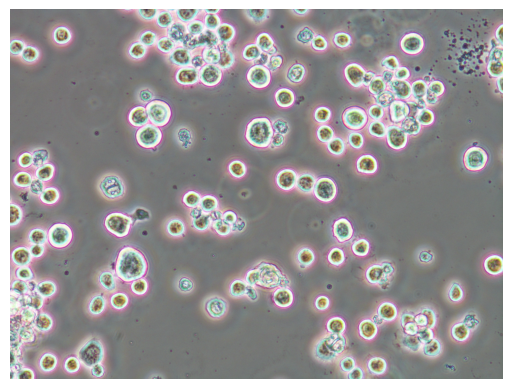

In [18]:
plt.imshow(imread(control[6]))
plt.axis('off')

In [19]:
f, img = hog(imread(malaria_images[40])[:,:,0], visualize = True)

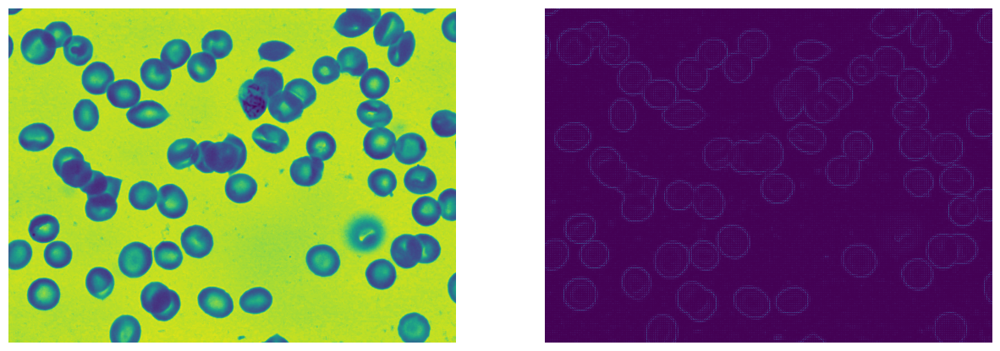

In [20]:
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (15, 7))
ax = ax.flatten()
ax[0].imshow(imread(malaria_images[40])[:,:,0])
ax[0].axis('off')
ax[1].imshow(img)
ax[1].axis('off')

plt.show()

Now I will try on Train Images

In [21]:
from model_train import Model_Trainer
import os
import  matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import random
from od import Object_Detection
from skimage.io import imread

In [22]:
malaria_image_names = os.listdir(malaria_folder)
malaria_images = [f'{malaria_folder}\\{image}' for image in malaria_image_names]

#importing JSON file

json_folder = r'C:\Users\nisha\Desktop\Coding\Thesis\Yolo\datasets\cell\malaria\malaria'

with open(f'{json_folder}\\training.json', 'r') as j:
    malaria_boxes = json.load(j)
    
#Defining a function to find the coordinates of boxes of the desired image
def find_index(image_name ,json_file = malaria_boxes):
    for i, image in enumerate(json_file):
        if image['image']['pathname'] == f'/images/{image_name}':
            return i
    return None


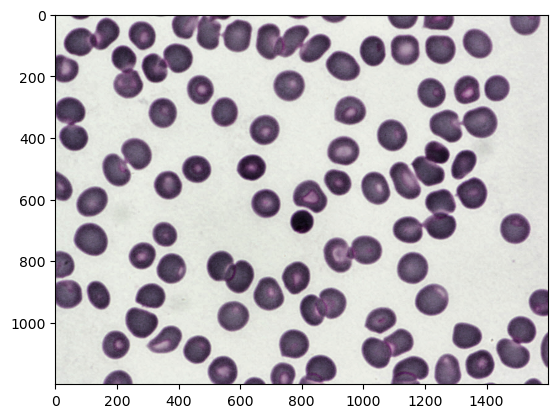

In [23]:
sample1 = imread(malaria_images[300])

plt.imshow(sample1)

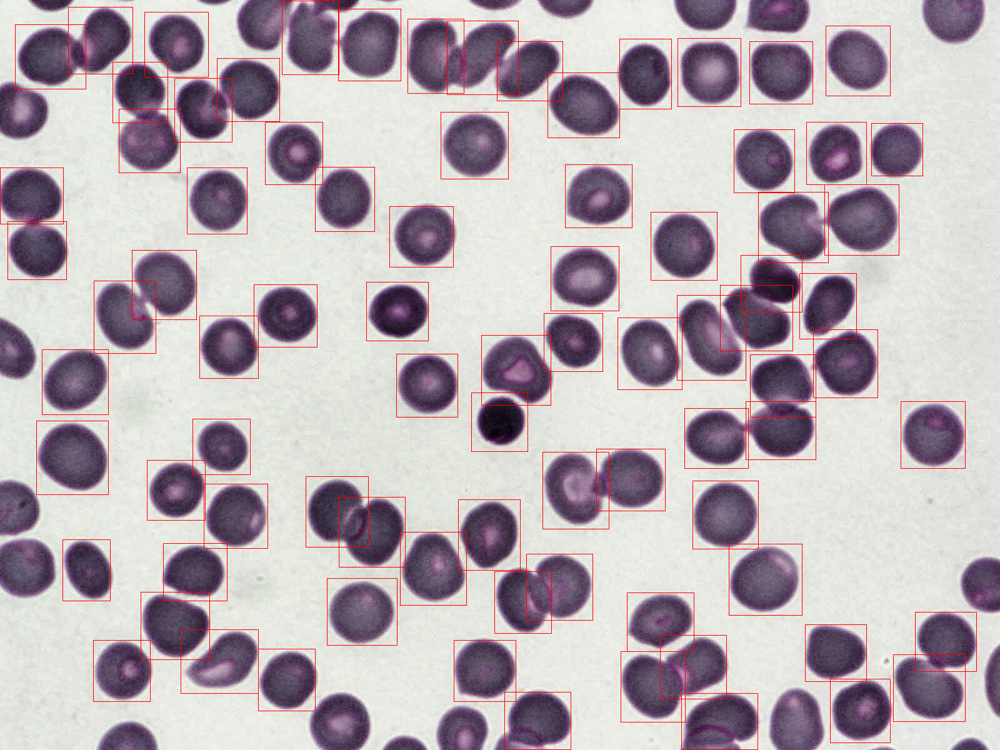

In [24]:
from PIL import Image, ImageDraw


def draw_boxes(image_path, index):
    sample1 = Image.open(image_path)
    sample1_draw = ImageDraw.Draw(sample1)

    for box in malaria_boxes[index]['objects']:
        minimum = (box['bounding_box']['minimum']['c'], box['bounding_box']['minimum']['r'])
        maximum = (box['bounding_box']['maximum']['c'], box['bounding_box']['maximum']['r'])
        sample1_draw.rectangle((minimum,maximum), outline = 'red')


    return sample1

#This code is finding the index of image in json file    
sample1_index = find_index(malaria_image_names[300])   
#This code is drawing bounding boxes on the image
draw_boxes(malaria_images[300], sample1_index)


In [25]:
from skimage import io
from skimage import draw

def draw_boxes(image_path, index):
    sample1 = io.imread(image_path)

    for box in malaria_boxes[index]['objects']:
        minimum = ( box['bounding_box']['minimum']['r'], box['bounding_box']['minimum']['c'])
        maximum = (box['bounding_box']['maximum']['r'], box['bounding_box']['maximum']['c'])
        rr, cc = draw.rectangle_perimeter(minimum,maximum, shape = sample1.shape)
        sample1[rr,cc] = [255,0,0]
        



    return sample1

print(draw_boxes(malaria_images[300], sample1_index).shape)



(1200, 1600, 3)


C:\ProgramData\anaconda3\Lib\site-packages\sklearn\base.py:347: InconsistentVersionWarning: Trying to unpickle estimator LinearSVC from version 0.24.2 when using version 1.3.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\base.py:347: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 0.24.2 when using version 1.3.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


The detected image is:


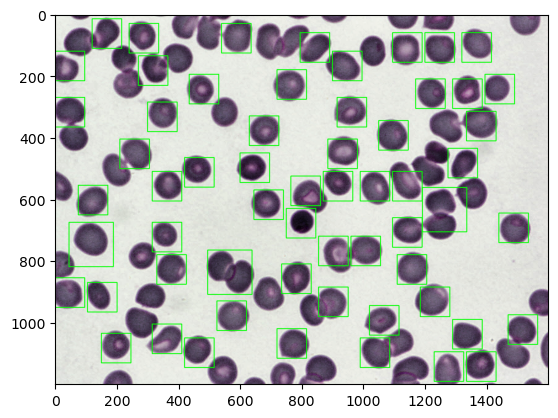

In [26]:

def detect_image(image):
    od = Object_Detection()
    param = {'resize_image' : False,
            'resize_size' : (imread(image).shape[1],imread(image).shape[0]),
             'dwn_scale' : 1.5,
             'scale' : 0,
             'fig_size': (10,10),
             'non_max_overlapThresh' : 0.008,
             'confidence_score' : 2,
             'step_size': 10,
             'orientations': 9,
            'pixels_per_cell' : (8, 8),
            'cells_per_block' : (2, 2),
            'threshold' : 2
            }
    od.load_param(param, image, 'model_r6.npy', 'scalar_r6.npy')
    od.detect()
    return od

od = detect_image(malaria_images[300])


In [27]:
print(imread(malaria_images[300]).shape[:2])

(1200, 1600)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 1599.5, 1199.5, -0.5)

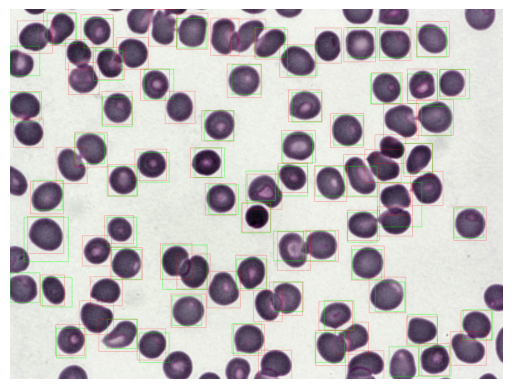

In [28]:
a = od.resized
combined = np.zeros_like(a)

combined = (a * 0.0015) + (draw_boxes(malaria_images[300], sample1_index) * 0.0025)

plt.imshow(combined)
plt.axis('off')

(1200, 1600, 3)
(1200, 1600, 3)


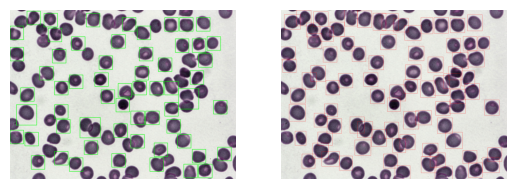

In [29]:
print(a.shape)
print(draw_boxes(malaria_images[300], sample1_index).shape)
fig, ax = plt.subplots(1, 2)
ax = ax.flatten()
ax[0].imshow(a)
ax[0].axis('off')
ax[1].imshow(draw_boxes(malaria_images[300], sample1_index))
ax[1].axis('off')
plt.show()

In [30]:
malaria_boxes[731]['objects'][:2]
#print(len(malaria_boxes[731]['objects']))
#sample1_index

[{'bounding_box': {'minimum': {'r': 1024, 'c': 726},
   'maximum': {'r': 1122, 'c': 825}},
  'category': 'red blood cell'},
 {'bounding_box': {'minimum': {'r': 653, 'c': 1095},
   'maximum': {'r': 749, 'c': 1197}},
  'category': 'red blood cell'}]

In [31]:

def convert_detection_to_simple(index, malaria_boxes):


    actual = np.zeros((len(malaria_boxes[index]['objects']),4), dtype = np.int32)

    for i, box in enumerate(malaria_boxes[index]['objects']):
        xmin,ymin = box['bounding_box']['minimum']['r'], box['bounding_box']['minimum']['c']
        xmax, ymax = box['bounding_box']['maximum']['r'], box['bounding_box']['maximum']['c']
        actual[i] = [xmin, ymin,xmax, ymax]
    return actual

actual = convert_detection_to_simple(731, malaria_boxes)
predicted = od.pick   
    

In [32]:
#def iou_calculate(actual, predicted):
actual = actual[np.argsort(actual[:,0])]
actual = actual[np.argsort(actual[:,1])]
predicted = predicted[np.argsort(predicted[:,0])]
predicted = predicted[np.argsort(predicted[:,1])]
print(actual.shape)
print(predicted.shape)


(83, 4)
(60, 4)


In [33]:
print(actual[0])
print(predicted[0])

def cal_area(coord):
    x1,y1,x2,y2 = coord
    area = abs(x2-x1) * abs(y2-y1)
    return area


def iou(matrix1, matrix2):
    #Sort all the detections
    matrix1 = matrix1[np.argsort(matrix1[:,0])]
    matrix1 = matrix1[np.argsort(matrix1[:,1])]
    matrix2 = matrix2[np.argsort(matrix2[:,0])]
    matrix2 = matrix2[np.argsort(matrix2[:,1])]
    
    # Pad the smaller matrix with zeros
    rows1, cols1 = matrix1.shape
    rows2, cols2 = matrix2.shape
    
    if rows1 < rows2:
        matrix1 = np.pad(matrix1, ((0, rows2 - rows1), (0, 0)), 'constant')
    elif rows2 < rows1:
        matrix2 = np.pad(matrix2, ((0, rows1 - rows2), (0, 0)), 'constant')
    if cols1 < cols2:
        matrix1 = np.pad(matrix1, ((0, 0), (0, cols2 - cols1)), 'constant')
    elif cols2 < cols1:
        matrix2 = np.pad(matrix2, ((0, 0), (0, cols1 - cols2)), 'constant')

    # Calculate the IoU
    intersection = np.logical_and(matrix1, matrix2)
    union = np.logical_or(matrix1, matrix2)
    iou_score = np.sum(intersection) / np.sum(union)
    return iou_score


print('\n\nThe IOU score of this detection is: ')

print(iou(actual, predicted))


[268   0 358 101]
[120  15 216 111]


The IOU score of this detection is: 
0.7108433734939759


In [34]:
def cell_count_accuracy(actual, predicted):
    return 1 - (abs(len(actual) - len(predicted))/ len(actual))

print('The cell count accuracy of this detection is:')
cell_count_accuracy(actual, predicted)

The cell count accuracy of this detection is:


0.7228915662650602

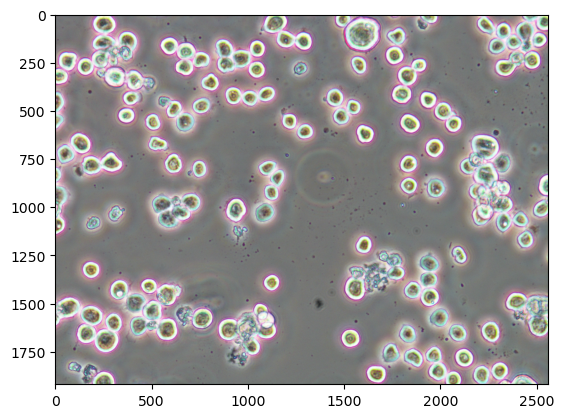

In [35]:
#Now applying on actual dataset

control_image = imread(control[5])
plt.imshow(control_image)


C:\ProgramData\anaconda3\Lib\site-packages\sklearn\base.py:347: InconsistentVersionWarning: Trying to unpickle estimator LinearSVC from version 0.24.2 when using version 1.3.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\base.py:347: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 0.24.2 when using version 1.3.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


The detected image is:


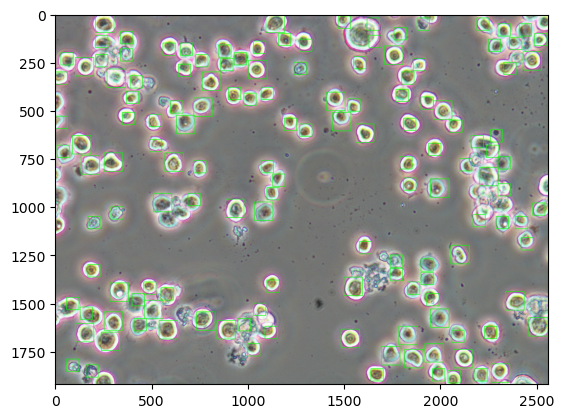

In [36]:
ci = detect_image(control[5])

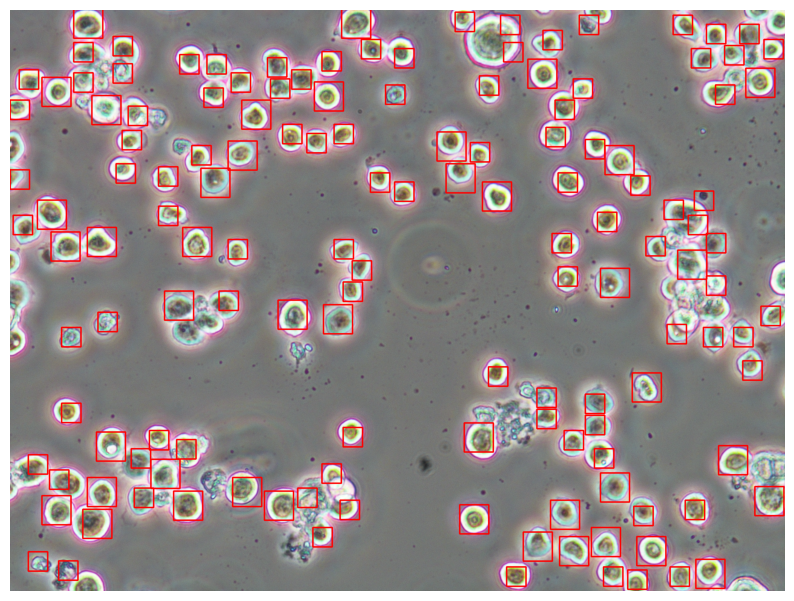

In [37]:
import cv2
def draw_boxes_simple(image_path, detections):
    sample1 = io.imread(image_path)

    for (xA, yA, xB, yB) in detections:
        cv2.rectangle(sample1, (xA, yA), (xB, yB), (255,0,0), 4)

        
    return sample1


ci_boxes = draw_boxes_simple(control[5], ci.pick)
plt.figure(figsize = (10,10))
plt.imshow(ci_boxes)
plt.axis('off')
plt.savefig(f'{save_folder}/control_image_detection.jpg')

In [38]:
"""
for i, image_url in enumerate(infected):
    #inf_image = plt.imread(image_url)
    ii = detect_image(image_url)
    plt.imshow(ii.resized)
    plt.show()
    #ii_boxes = draw_boxes_simple(image_url, ii.pick)
    #plt.imshow(ii_boxes)
    #plt.imsave(f'{save_folder}/infected_image_{i}.jpg', ii_boxes)
    
"""
    

"\nfor i, image_url in enumerate(infected):\n    #inf_image = plt.imread(image_url)\n    ii = detect_image(image_url)\n    plt.imshow(ii.resized)\n    plt.show()\n    #ii_boxes = draw_boxes_simple(image_url, ii.pick)\n    #plt.imshow(ii_boxes)\n    #plt.imsave(f'{save_folder}/infected_image_{i}.jpg', ii_boxes)\n    \n"

In [39]:
malaria

NameError: name 'malaria' is not defined